# Coursera Capstone Project
### Enrico  Tomassoli -September 5th, 2020



## Import libraries

In [2]:
#Import all the modules used in this study
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import folium
import geocoder
import requests
from sklearn.cluster import KMeans

## Raw Data Collection
In this first section the data from different internet sources will be collected, cleaned and maniulated for the analysis.

### Zip Codes and Areas
From the url indicated below, the data related to the zip codes considered in this study is collated.

In [3]:
url_zip = 'https://www.health.ny.gov/statistics/cancer/registry/appendix/neighborhoods.htm'
raw_zip = pd.read_html(url_zip)[0]
raw_zip.head(10)

,Borough,Neighborhood,ZIP Codes
0,Bronx,Central Bronx,"10453, 10457, 10460"
1,Bronx,Bronx Park and Fordham,"10458, 10467, 10468"
2,Bronx,High Bridge and Morrisania,"10451, 10452, 10456"
3,Bronx,Hunts Point and Mott Haven,"10454, 10455, 10459, 10474"
4,Bronx,Kingsbridge and Riverdale,"10463, 10471"
5,Bronx,Northeast Bronx,"10466, 10469, 10470, 10475"
6,Bronx,Southeast Bronx,"10461, 10462,10464, 10465, 10472, 10473"
7,Brooklyn,Central Brooklyn,"11212, 11213, 11216, 11233, 11238"
8,Brooklyn,Southwest Brooklyn,"11209, 11214, 11228"
9,Brooklyn,Borough Park,"11204, 11218, 11219, 11230"


For all the zip codes, only the ones in Mahnattan are considered.

In [4]:
# Only the zip codes in Manhattan are considered 
# The rows with "Borough" = "Manhattan" are first selected. Then the "ZIP Codes" column is considered.
a = raw_zip[raw_zip['Borough']=='Manhattan']['ZIP Codes']

# A cycle is used to extract zip codes from the same line. The main scope is to have a list of 43 zip codes in Mahnattan
# ordered ascending.
zip_list = []
for i in range(0,len(a),1):
    b = a.iloc[i].split(sep=',',maxsplit=-1)
    for j in range(0,len(b),1):
        zip_list.append(int(b[j]))
zip_list = sorted(zip_list)

# Zip code 10020 needs to be removed since it is related to the teather discticts, and the income data for it is -1 $. 
zip_list.remove(10020)

# A preview of the list is printed    
print('List of zip codes (' + str(len(zip_list)) + ' in total):\n--------------------------------\n' + str(zip_list))

List of zip codes (42 in total):
--------------------------------
[10001, 10002, 10003, 10004, 10005, 10006, 10007, 10009, 10010, 10011, 10012, 10013, 10014, 10016, 10017, 10018, 10019, 10021, 10022, 10023, 10024, 10025, 10026, 10027, 10028, 10029, 10030, 10031, 10032, 10033, 10034, 10035, 10036, 10037, 10038, 10039, 10040, 10044, 10065, 10075, 10128, 10280]


The DataFrame where the data is saved is created.

In [5]:
# the DataFrame is initialized with the list of zip code.
df = pd.DataFrame({"ZIP Code":zip_list})
add = []
for i in range(0,df.shape[0],1):
    add.append(str(df['ZIP Code'][i]))
df['String ZIP Code'] = add

### Demographic
From the we site www.zipdatamaps.com, the data related to populatio, test score, real estae price is collated. This info need to be considered before we get the info from Foursquare since latitude and longitude are necessary to locate the areas.

In [6]:
population = []
test_score = []
lat = []
lon = []
ave_ask_price = []
ave_sale_price = []

for i in range(0,len(zip_list),1):
    url_demog = 'https://www.zipdatamaps.com/'+str(zip_list[i])
    raw_demog = pd.read_html(url_demog)
    raw_demog[0].set_index(raw_demog[0][0],inplace=True)
    population.append(int(raw_demog[0].loc['Current Population:',1]))
    test_score.append(raw_demog[0].loc['School Test Performance:',1])
    lat.append(float(raw_demog[0].loc['Coordinates(Y,X)',1].split(',')[0]))
    lon.append(float(raw_demog[0].loc['Coordinates(Y,X)',1].split(',')[1]))

    for j in range(5,10,1): # The location of this info is not the same on each web page, and we neeed to scan it
        if raw_demog[j].iloc[:,0][0] == 'Average Real Estate Asking Price':
            ave_ask_price.append(float(raw_demog[j].iloc[0,1].replace('$','')))
            ave_sale_price.append(float(raw_demog[j].iloc[1,1].replace('$','')))
            break
            
if len(ave_sale_price) == len(zip_list) == len(ave_ask_price): print('Process completed correctly!!!')
else : print('--- ERROR ---')

Process completed correctly!!!


### Foursquare data
Data related to the venues for each zip code is collected. With this aim, a list of the urls considered is created.

In [7]:
CLIENT_ID = 'N5ZC0IQJAGXXHSEKQC3Y3NFVLLZDT3XP313D0O54XT2KIALI' # your Foursquare ID
CLIENT_SECRET = 'Q52RXWLO3GPQCWBF2OTI3B3UP0RSUB0FOTKYCU51IPWPISAU' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
venues_limit = 100
radius = 600 # In meters

url = []  # This list contains all the urls for the zip codes considered
results = []  # The results will be saved in a list, where each element contains the json file info
for i in range(0,len(zip_list),1):
    url.append('https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID, CLIENT_SECRET, VERSION, lat[i], lon[i], radius, venues_limit))
    results.append(requests.get(url[i]).json())

For each url created, which is related to the zip codes areas, we extract the venue names and venue categories found in the zip code areas.

In [8]:
Foursquare_ouput = []  # The list containing dataframes for the Foursquare output is initialized. Each element is a dafaframe

for res_no in range(0,len(zip_list),1):   
    tot_res_zip = min(results[ res_no ]['response']['totalResults'],100) # We consider only the first 100 venues or the max found in the area
    venue = []
    venue_cat = []

    for item_no in range(0,tot_res_zip,1): 
        venue.append(results[ res_no ]['response']['groups'][0]['items'][item_no]['venue']['name'])
        venue_cat.append(results[ res_no ]['response']['groups'][0]['items'][item_no]['venue']['categories'][0]['name'])
 
    Foursquare_ouput.append(pd.DataFrame({'Venue Category':venue_cat,'Venue':venue})) # DataFrame is saved in the list

Among the results found in each area, we filter the results to identify the sport-related businesses that containg the keywords indicated below.

In [9]:
key_word = ['Gym','Athletics','Studio','Martial Arts','Bike',
            'Golf','Tennis','Soccer','Volleyball','Basketball','Sports Club',]

Foursquare_filter = [] # The list containing dataframes for the Foursquare output that will be filtered

for i in range(0,len(Foursquare_ouput),1):
    filter_venue = []
    filter_venue_cat = []

    for k in key_word:
        filter_venue_cat = filter_venue_cat + (Foursquare_ouput[i][Foursquare_ouput[i]['Venue Category'].str.contains(k)]['Venue Category'].to_list())
        filter_venue = filter_venue + (Foursquare_ouput[i][Foursquare_ouput[i]['Venue Category'].str.contains(k)]['Venue'].to_list())
       
    Foursquare_filter.append(pd.DataFrame({'Venue Category':filter_venue_cat,'Venue':filter_venue}))
        

When both the total number of businesses and the ones that are sport-related are avaialble, the related percentage can be calculated to characterizedeach zip code area.

In [10]:
business_ratio = []
for i in range(0,len(Foursquare_ouput),1):
    business_ratio.append(int(len(Foursquare_filter[i])/len(Foursquare_ouput[i])*100))

### Income
From the website https://www.incomebyzipcode.com the income data is collecte for each zip code.

In [11]:
med_hous_inc = []
ave_hous_inc = []
cap_inc = []

for i in range(0,len(zip_list),1):
    url_income = 'https://www.incomebyzipcode.com/newyork/'+str(zip_list[i])
    raw_income = pd.read_html(url_income)
    # print(i+1,' - ',zip_list[i]) # This in only for check
    med_hous_inc.append(float(raw_income[0].iloc[0,0].replace('$','').replace(',','')))
    ave_hous_inc.append(float(raw_income[1].iloc[0,0].replace('$','').replace(',','')))
    cap_inc.append(float(raw_income[2].iloc[0,0].replace('$','').replace(',','')))
    
if (i+1 == len(zip_list)): print('Process completed correctly !!!')
else : print('--- ERROR ---')

Process completed correctly !!!


### Area land
From  internet the csv file 'DataByZip_Manhattan.csv' was dowloaded to associate the related area land to each zip code.

In [12]:
area_land = []

raw_area = pd.read_csv('DataByZip_Manhattan.csv')
raw_area.set_index(raw_area['Zip/ZCTA'],inplace=True)

for i in zip_list:
    # print(i,' - ',round(raw_area.loc[i,'Land-Sq-Mi'],3)) # This is just for debuggin
    area_land.append(raw_area.loc[i,'Land-Sq-Mi'])

if len(area_land) == len(zip_list): print('Process completed correctly!!!')
else : print('--- ERROR ---')

Process completed correctly!!!


### Test Score converted in number scale
In order to deal with numeric values, the test scores are translater into integers from 1 to 5.

In [13]:
num_test_score = []

for i in range(0,len(test_score),1):
    if test_score[i] == 'Poor': num_test_score.append(1)
    elif test_score[i] == 'Below Average': num_test_score.append(2)
    elif test_score[i] == 'Average': num_test_score.append(3)
    elif test_score[i] == 'Above Average': num_test_score.append(4)
    elif test_score[i] == 'Excellent': num_test_score.append(5)
        
if len(num_test_score) == len(zip_list): print('Process completed correctly!!!')
else : print('--- ERROR ---')

Process completed correctly!!!


### Creation of DataFrame with raw data
When all the raw data is collected, it is stored in a DataFrame used later for the analyses.

In [14]:
df['Latitude'] = lat
df['Longitude'] = lon
df['Population'] = population
df['Area'] = area_land
df['Population Density'] = np.around(np.array(population)/np.array(area_land),0)
df['Median Household Income'] = med_hous_inc
df['Average Household Income'] = ave_hous_inc
df['Per-Capita Income'] = cap_inc
#df['Household Income Distribution Factor'] = df['Median Household Income'] / df['Average Household Income']
#df['Household Factor'] = df['Average Household Income'] / df['Per-Capita Income']
df['Average Real Estate Asking Price'] = ave_ask_price
df['Average Real Estate Sale Price'] = ave_sale_price
#df['Real Estate Factor'] = df['Average Real Estate Asking Price'] / df['Average Real Estate Sale Price']
df['Test Score'] = test_score
df['Numeric Test Score'] = num_test_score
df['Sport Business Ratio'] = business_ratio

In [15]:
df.head(10)

,ZIP Code,String ZIP Code,Latitude,Longitude,Population,Area,Population Density,Median Household Income,Average Household Income,Per-Capita Income,Average Real Estate Asking Price,Average Real Estate Sale Price,Test Score,Numeric Test Score,Sport Business Ratio
0,10001,10001,40.750809,-73.996620,21102,0.614,34368.0,88526.0,151628.0,84765.0,1603814.0,1822618.0,Above Average,4,16
1,10002,10002,40.716469,-73.986183,81410,0.878,92722.0,35859.0,68315.0,32694.0,1194750.0,553000.0,Average,3,2
2,10003,10003,40.731701,-73.988838,56024,0.576,97264.0,112131.0,189885.0,92781.0,1587643.0,1646747.0,Above Average,4,5
3,10004,10004,40.703640,-74.014214,3089,0.560,5516.0,157645.0,218650.0,122165.0,878278.0,692808.0,Poor,1,4
4,10005,10005,40.706139,-74.008392,7135,0.071,100493.0,173333.0,208186.0,106702.0,995792.0,730625.0,Poor,1,8
5,10006,10006,40.709671,-74.013344,3011,0.092,32728.0,176250.0,214543.0,114611.0,1424800.0,932000.0,Poor,1,7
6,10007,10007,40.714352,-74.008011,6988,0.162,43136.0,246813.0,367343.0,147547.0,2135800.0,2350000.0,Excellent,5,12
7,10009,10009,40.727242,-73.980293,61347,0.617,99428.0,61548.0,95947.0,51655.0,963857.0,780469.0,Below Average,2,1
8,10010,10010,40.738918,-73.984161,31834,0.390,81626.0,117923.0,188064.0,93605.0,1477389.0,1870269.0,Average,3,6
9,10011,10011,40.740631,-74.000450,50984,0.661,77132.0,128613.0,207287.0,121991.0,2011029.0,1648559.0,Excellent,5,6


### Raw data correlation
When the DataFram is available, a preliminary correlation analysis can be perfomed in order to spot any particular relationship among the values. Wiht his aim, a colored matrix is created where the correlations factors greated that 0.5 and lower than -0.5 are considered. The matrix is shown below and the results are also proposed in table format for clarity. 

Number of unique correlations > 0.5 or < -0.5 = 13
-------------------------------------------------------------------------------------------
Case #	 Corr        	 Parameters
-------------------------------------------------------------------------------------------
1 	 -0.54    	 Area  vs.  Median Household Income
2 	 0.513    	 Average Real Estate Sale Price  vs.  Numeric Test Score
3 	 0.532    	 Average Real Estate Sale Price  vs.  Median Household Income
4 	 0.584    	 Population  vs.  Population Density
5 	 0.595    	 Area  vs.  Population
6 	 0.629    	 Average Real Estate Asking Price  vs.  Per-Capita Income
7 	 0.641    	 Average Household Income  vs.  Average Real Estate Asking Price
8 	 0.685    	 Average Real Estate Sale Price  vs.  Per-Capita Income
9 	 0.73    	 Average Household Income  vs.  Average Real Estate Sale Price
10 	 0.739    	 Average Real Estate Asking Price  vs.  Average Real Estate Sale Price
11 	 0.897    	 Median Household Income  vs.  Per-Capita Income


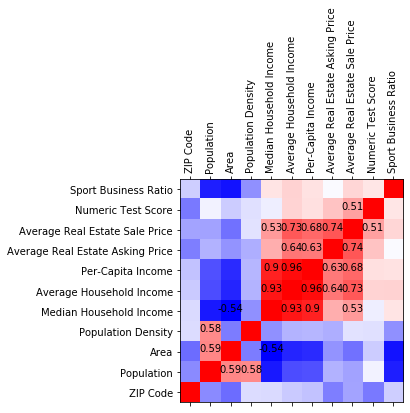

In [16]:
corr_limit = 0.5
parameters = ['ZIP Code','Population','Area','Population Density','Median Household Income',
             'Average Household Income','Per-Capita Income','Average Real Estate Asking Price',
             'Average Real Estate Sale Price','Numeric Test Score','Sport Business Ratio']
df_corr = df[parameters].corr()
plt.matshow(df_corr,cmap='bwr')
plt.xticks(np.arange(len(parameters)),parameters,rotation=90)
plt.yticks(np.arange(len(parameters)),parameters)
plt.ylim(-0.5,len(parameters)-0.5)

results = []
for i in range(0,len(parameters),1):
    for j in range(0,len(parameters),1):
        if abs(df_corr.iloc[i,j]) > corr_limit and df_corr.iloc[i,j] != 1:
            plt.text(i,j,round(df_corr.iloc[i,j],2),ha='center',ma='center')
            results.append([str(round(df_corr.iloc[i,j],3)),parameters[i],parameters[j]])
results.sort()
 
print('Number of unique correlations >',corr_limit,'or <',-corr_limit,'=',int(len(results)/2))  
print('-------------------------------------------------------------------------------------------')
print('Case #\t Corr        \t Parameters')
print('-------------------------------------------------------------------------------------------')

for i in range(0,len(results),2):
    print(int((i+2)/2),'\t',results[i][0],'   \t',results[i][1],' vs. ',results[i][2])
print('-------------------------------------------------------------------------------------------')   

### Significant data correlation and graphic representation
From the results above, the significant correlations are proposed and the related regression analyisis are proposed for all the main cases. Scroll down to see all the cases.

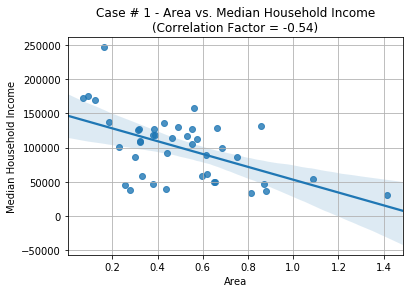

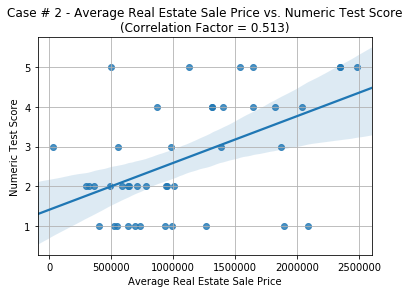

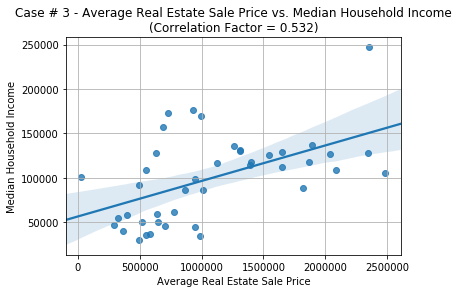

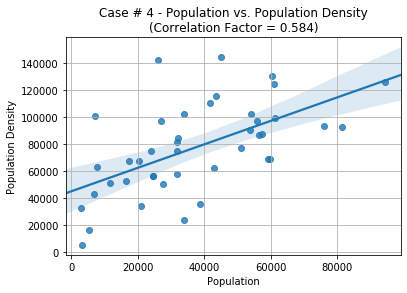

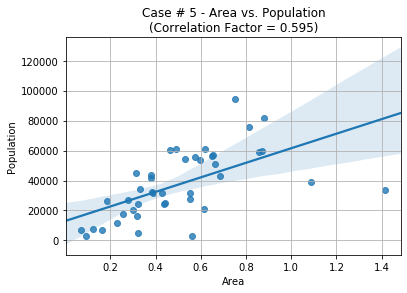

...

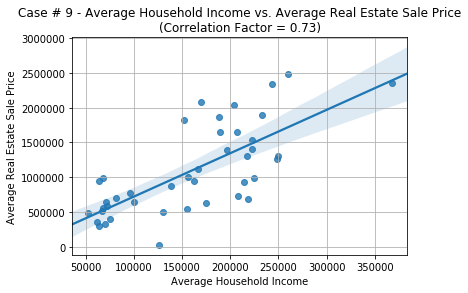

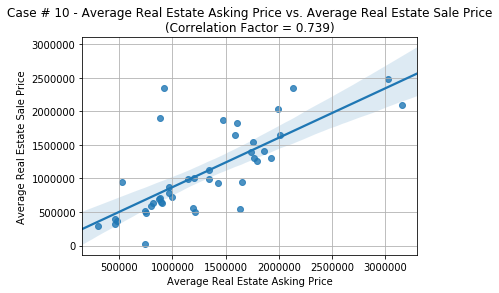

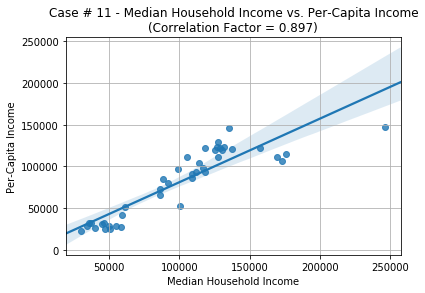

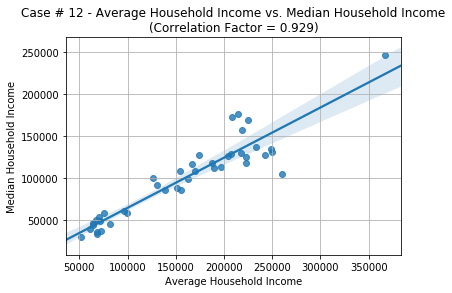

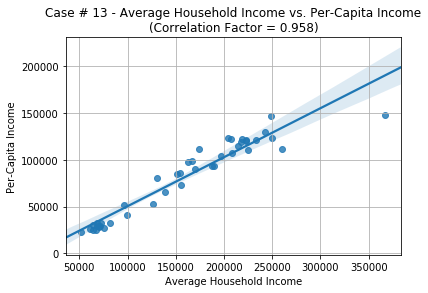

In [17]:
for i in range(0,len(results),2):
        sns.regplot(data=df,x=results[i][1],y=results[i][2])
        plt.title(str('Case # ' + str(int((i+2)/2)) + ' - ' + results[i][1] + ' vs. ' + results[i][2] + '\n(Correlation Factor = ' + results[i][0] + ')'))
        plt.grid()
        plt.show()

#### Investigation of the Sport Business Ratio versus Zip Code Area
The relation between the Sport Business Ratio and the Zip Code Area is here considered, even if the correlation is not sighificant.

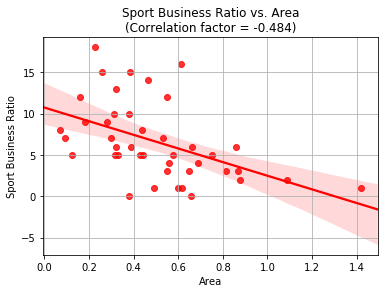

In [18]:
X1 ='Area'
Y1 ='Sport Business Ratio'

plt.title('Sport Business Ratio vs. Area\n(Correlation factor = ' + str(round(df[[X1,Y1]].corr().iloc[0,1],3)) + ')')
sns.regplot(data=df,x=X1,y=Y1,color='r')
print()
plt.grid()
plt.show()

#### Investigation of the Sport Business Ratio versus Population Density
The relation between the Sport Business Ratio and the Population Density is here considered, even if the correlation is not sighificant.

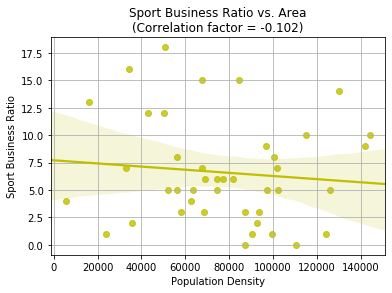

In [19]:
X2 ='Population Density'
Y2 ='Sport Business Ratio'

plt.title('Sport Business Ratio vs. Area\n(Correlation factor = ' + str(round(df[[X2,Y2]].corr().iloc[0,1],3)) + ')')
sns.regplot(data=df,x=X2,y=Y2,color='y')
print()
plt.grid()
plt.show()

## Folium and representation of the results
The results stored in the DataFrame are presented in the form of maps with different colors. Refer to the legend for the tpye of info considered.

In [20]:
# This script allows to get the coordinates of the zip code area
g = geocoder.arcgis('Manhnattan, NY')
NY_coor = [g.lat,g.lng]

In [21]:
map_zip = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_zip.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'ZIP Code'],
    key_on='feature.properties.postalCode', fill_color='GnBu', fill_opacity=0.8, line_opacity=1, legend_name='ZIP Codes')

for i in range(0,len(zip_list),1):
    popup = 'Zip Code ' + df['String ZIP Code'][i] + ' - Area ' + str(round(df['Area'][i],2)) + ' sq mile - Populaton ' + str(df['Population'][i])
    zip_info = folium.Marker(location=[df['Latitude'][i],df['Longitude'][i]],popup=popup,icon=folium.Icon(color='green', icon='info-sign')) 
    map_zip.add_child(zip_info)
map_zip

In [22]:
map_populat = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_populat.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Population'],
    key_on='feature.properties.postalCode', fill_color='Oranges', fill_opacity=0.8, line_opacity=1,
    legend_name='Population')
map_populat

In [23]:
map_pop_dens = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_pop_dens.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Population Density'],
    key_on='feature.properties.postalCode', fill_color='Reds', fill_opacity=0.8, line_opacity=1,
    legend_name='Population Density (People per sq mile)')
map_pop_dens

In [24]:
map_percap_inc = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_percap_inc.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Per-Capita Income'],
    key_on='feature.properties.postalCode', fill_color='Blues', fill_opacity=0.8, line_opacity=1,
    legend_name='Per-Capita Income')
map_percap_inc

In [25]:
map_median_inc = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_median_inc.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Median Household Income'],
    key_on='feature.properties.postalCode', fill_color='Blues', fill_opacity=0.8, line_opacity=1,
    legend_name='Median Household Income')
map_median_inc

In [26]:
map_aver_inc = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_aver_inc.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Average Household Income'],
    key_on='feature.properties.postalCode', fill_color='Blues', fill_opacity=0.8, line_opacity=1,
    legend_name='Median Household Income')
map_aver_inc

In [27]:
map_RE_ask = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_RE_ask.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Average Real Estate Asking Price'],
    key_on='feature.properties.postalCode', fill_color='RdPu', fill_opacity=0.8, line_opacity=1,
    legend_name='Average Real Estate Asking Price')
map_RE_ask

In [28]:
map_RE_sale = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_RE_sale.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Average Real Estate Sale Price'],
    key_on='feature.properties.postalCode', fill_color='RdPu', fill_opacity=0.8, line_opacity=1,
    legend_name='Average Real Estate Sale Price')

map_RE_sale.save('Image.jpeg')
map_RE_sale

In [29]:
map_test = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_test.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Numeric Test Score'],
    key_on='feature.properties.postalCode', fill_color='YlGnBu', fill_opacity=0.8, line_opacity=1,
    legend_name='Test Score')
map_test

In [30]:
map_business = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_business.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Sport Business Ratio'],
    key_on='feature.properties.postalCode', fill_color='PuRd', fill_opacity=0.8, line_opacity=1,
    legend_name='Percentage of sport-related businesses per zip code area')
map_business

## Parameters used in the K-Menas clustering analyses
The parameters indicated below are considered in the K-Mean model.

In [31]:
df_param = df[['Population','Population Density','Median Household Income','Average Household Income',
              'Per-Capita Income','Average Real Estate Sale Price','Numeric Test Score','Sport Business Ratio']]
df_param.head(10)

,Population,Population Density,Median Household Income,Average Household Income,Per-Capita Income,Average Real Estate Sale Price,Numeric Test Score,Sport Business Ratio
0,21102,34368.0,88526.0,151628.0,84765.0,1822618.0,4,16
1,81410,92722.0,35859.0,68315.0,32694.0,553000.0,3,2
2,56024,97264.0,112131.0,189885.0,92781.0,1646747.0,4,5
3,3089,5516.0,157645.0,218650.0,122165.0,692808.0,1,4
4,7135,100493.0,173333.0,208186.0,106702.0,730625.0,1,8
5,3011,32728.0,176250.0,214543.0,114611.0,932000.0,1,7
6,6988,43136.0,246813.0,367343.0,147547.0,2350000.0,5,12
7,61347,99428.0,61548.0,95947.0,51655.0,780469.0,2,1
8,31834,81626.0,117923.0,188064.0,93605.0,1870269.0,3,6
9,50984,77132.0,128613.0,207287.0,121991.0,1648559.0,5,6


### DataFrame normalization
The DataFrame is normalized considering the minimum and the maximum of the range of each parameter.

In [32]:
df_param_norm = pd.DataFrame()

for i in df_param.columns:
    df_param .loc[:,i].min()
    df_param .loc[:,i].max()
    df_param_norm[i] = round(( df_param .loc[:,i]-df_param .loc[:,i].min() ) / ( df_param .loc[:,i].max() - df_param .loc[:,i].min()),3)

df_param_norm.head(10)

,Population,Population Density,Median Household Income,Average Household Income,Per-Capita Income,Average Real Estate Sale Price,Numeric Test Score,Sport Business Ratio
0,0.198,0.208,0.270,0.316,0.497,0.730,0.75,0.889
1,0.856,0.629,0.027,0.051,0.079,0.213,0.50,0.111
2,0.579,0.661,0.379,0.437,0.561,0.659,0.75,0.278
3,0.001,0.000,0.589,0.528,0.797,0.270,0.00,0.222
4,0.045,0.685,0.661,0.495,0.673,0.286,0.00,0.444
5,0.000,0.196,0.674,0.515,0.736,0.368,0.00,0.389
6,0.043,0.271,1.000,1.000,1.000,0.945,1.00,0.667
7,0.637,0.677,0.145,0.139,0.231,0.306,0.25,0.056
8,0.315,0.549,0.405,0.431,0.568,0.750,0.50,0.333
9,0.524,0.516,0.455,0.492,0.795,0.659,1.00,0.333


### Normalized data info
The DataFrame shown below provide a summary of the main info related to the normalized data.

In [33]:
df_param_norm.describe()

,Population,Population Density,Median Household Income,Average Household Income,Per-Capita Income,Average Real Estate Sale Price,Numeric Test Score,Sport Business Ratio
count,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000
mean,0.374119,0.517690,0.322381,0.337905,0.466929,0.430857,0.422619,0.366476
std,0.243975,0.238999,0.219517,0.234975,0.323854,0.257815,0.364123,0.259079
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.206000,0.364000,0.118500,0.080000,0.079000,0.232500,0.062500,0.167000
50%,0.328500,0.507000,0.356000,0.357500,0.551500,0.374000,0.250000,0.305500
75%,0.574000,0.673000,0.449750,0.523250,0.763750,0.601750,0.750000,0.500000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Clustering Investigation
At priori we do not know the best number of clusters that we should use. A preliminary investigation is performed to define the best number based on the following results. Also refer to the report for a more detail description of the graph proposed below.

In [34]:
# Investogation of best number of clusters
max_cluster = 10 # Max number of clusers that is investigated
clust_invest = pd.DataFrame()

for i in range(3,max_cluster+1,1):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(df_param_norm)
    # check cluster labels generated for each row in the dataframe
    clust_invest[i] = kmeans.labels_

In [35]:
clust_invest_result = pd.DataFrame()
for j in range(3,max_cluster+1,1):
    clust_invest_result[j] = clust_invest[j].value_counts().describe()

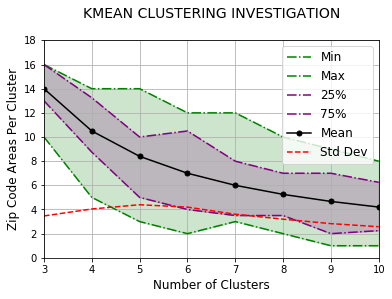

In [36]:
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['min',:],marker='o',ms=0,ls='-.',c='green')
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['max',:],marker='o',ms=0,ls='-.',c='green')
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['25%',:],marker='o',ms=0,ls='-.',c='purple')
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['75%',:],marker='o',ms=0,ls='-.',c='purple')
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['mean',:],marker='o',ms=5,ls='-',c='black')
plt.plot(list(range(3,max_cluster+1,1)),clust_invest_result.loc['std',:],marker='o',ms=0,ls='--',c='red')
plt.fill_between(list(range(3,max_cluster+1,1)), clust_invest_result.loc['max',:],
                 clust_invest_result.loc['min',:],alpha=0.2,color='green')
plt.fill_between(list(range(3,max_cluster+1,1)), clust_invest_result.loc['25%',:],
                 clust_invest_result.loc['75%',:],alpha=0.2,color='purple')

legend_label = ['Min','Max','25%','75%','Mean','Std Dev']
plt.grid()
plt.xlim(3,10)
plt.ylim(0,18)
plt.xlabel('Number of Clusters',fontsize=12)
plt.ylabel('Zip Code Areas Per Cluster',fontsize=12)
plt.legend(legend_label,fontsize=12)
plt.title('KMEAN CLUSTERING INVESTIGATION\n',fontsize=14)
plt.show()

### Clustering
Five clusers are considered for the K-Mean model used to classify the 42 zip code areas. The results of the clustering is shown in the map mbelow.

In [37]:
kclusters = 5
# run k-means clustering
model = KMeans(n_clusters=kclusters, random_state=0).fit(df_param_norm)
# check cluster labels generated for each row in the dataframe
df['Cluster'] = model.labels_
df_param['Cluster'] = model.labels_

C:\Users\enric\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [38]:
map_cluster = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_cluster.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df, columns=['String ZIP Code', 'Cluster'],
    key_on='feature.properties.postalCode', fill_color='YlGn', fill_opacity=0.8, line_opacity=1,
    legend_name='Clusters')
map_cluster

### Average characteristics of clusters
The DataFrame below provide the average characteristics of each cluster. The average of hte entire population is also provided.

In [90]:
df_clusters = pd.DataFrame()
for i in range(0,kclusters,1):
    df_clusters['Cluster ' + str(i+1)] = df_param[df_param['Cluster'] == i].describe().loc['mean',:]
df_clusters['Average'] = df_param.describe().loc['mean',:]
df_clusters.drop('Cluster',inplace=True)
df_clusters

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Average
Population,2.231933e+04,52933.785714,16789.7,49449.0,19038.0,3.727638e+04
Population Density,5.932533e+04,83588.857143,62412.9,99865.0,55351.4,7.732752e+04
Median Household Income,1.598767e+05,49290.357143,139387.1,122183.1,82400.4,9.993807e+04
Average Household Income,2.900497e+05,78941.857143,201042.9,206549.1,122253.2,1.586315e+05
Per-Capita Income,1.294887e+05,34106.142857,110643.6,111765.3,62774.2,8.104552e+04
Average Real Estate Sale Price,2.394282e+06,593094.928571,1072727.7,1528863.7,832568.8,1.087260e+06
Numeric Test Score,5.000000e+00,2.000000,1.1,4.1,3.6,2.690476e+00
Sport Business Ratio,1.300000e+01,3.071429,6.6,6.8,12.2,6.595238e+00


In [1056]:
df_clusters_comp = pd.DataFrame()
for i in range(0,kclusters,1):
    df_clusters_comp['Cluster ' + str(i+1)] = round(df_clusters['Cluster ' + str(i+1)] / df_clusters['Average'],2)

### Normalization of clusters
Using the info above, each value can be normalized simply dividing them by the average. The results are shown below.

In [1057]:
df_clusters_comp

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5
Population,1.21,1.54,0.48,0.46,0.59
Population Density,1.21,1.10,0.87,0.74,0.69
Median Household Income,1.17,0.51,1.43,0.66,1.42
Average Household Income,1.23,0.51,1.30,0.60,1.61
Per-Capita Income,1.30,0.43,1.40,0.56,1.46
Average Real Estate Sale Price,1.28,0.56,1.04,0.46,2.07
Numeric Test Score,1.55,0.74,0.41,0.74,1.77
Sport Business Ratio,0.99,0.37,0.82,2.00,2.06


## Similarity with other locations and reccomendations
We assume that normalized data is available for an existing location where a business owner alreay runs a successfull bisiness. The K-Mean model is here used to predict which cluster in NY the existing business condition is more similar to, provide meaningful inshight to where open a new venture. The list of zip code areas that are similar to the existing data are reported.

In [43]:
exist_loc = np.array([[0.05, 0.30, 0.90, 0.95, 0.85, 0.95, 0.85, 0.70]])
similar_cluster = model.predict(exist_loc)
similar_cluster

df_sim_clus = df[df['Cluster'] == int(similar_cluster)]
df_sim_clus

,ZIP Code,String ZIP Code,Latitude,Longitude,Population,Area,Population Density,Median Household Income,Average Household Income,Per-Capita Income,Average Real Estate Asking Price,Average Real Estate Sale Price,Test Score,Numeric Test Score,Sport Business Ratio,Cluster
6,10007,10007,40.714352,-74.008011,6988,0.162,43136.0,246813.0,367343.0,147547.0,2135800.0,2350000.0,Excellent,5,12,0
11,10013,10013,40.721050,-74.003548,27700,0.550,50364.0,105442.0,259828.0,111109.0,3029894.0,2485373.0,Excellent,5,12,0
38,10065,10065,40.764296,-73.962462,32270,0.382,84476.0,127375.0,242978.0,129810.0,922497.0,2347473.0,Excellent,5,15,0


### Mapping of similar zip code areas
For an easy identification of the possible location on interest, the map below shows the similar zip code areas.

In [44]:
map_sim_cluster = folium.Map(location=NY_coor, zoom_start=11,tiles='Stamen Terrain')

map_sim_cluster.choropleth(
    geo_data='NYCZipCodeBoudaries.json', data=df_sim_clus, columns=['String ZIP Code', 'Cluster'],
    key_on='feature.properties.postalCode', fill_color='Reds', fill_opacity=0.8, line_opacity=1)
map_sim_cluster

### Venues for the selected zip code areas
For the zip code areas considered, all the venues are listed to give an idea of the types of businesses for that specific locaitions. Scroll to see all the results.

In [1114]:
for i,j in enumerate(df_sim_clus.index):
    print('\n-------------------------------------\nZIP CODE',zip_list[j],'(Similar Area no.',i+1,')\n-------------------------------------' )
    print(Foursquare_ouput[j])


-------------------------------------
ZIP CODE 10001 (Similar Area no. 1 )
-------------------------------------
             Venue Category                                              Venue
0               Pizza Place                             New York Pizza Suprema
1              Dance Studio               You Should Be Dancing…..! / Club 412
2               Coffee Shop                                     Bluestone Lane
3               Music Venue                                       Music Choice
4        Basketball Stadium                              Madison Square Garden
5              Camera Store                                    B&H Photo Video
6               Music Venue                                       Hulu Theater
7        Chinese Restaurant                                      Panda Express
8       Peruvian Restaurant                                              Chirp
9                     Hotel  Fairfield Inn & Suites by Marriott New York Mi...
10               

### Sport-related venues for the selected zip code areas
For the zip code areas considered, only the sport-related venues are listed to give an idea of the types of businesses for that specific locaitions. Scroll to see all the results.

In [1115]:
for i,j in enumerate(df_sim_clus.index):
    print('\n-------------------------------------\nZIP CODE',zip_list[j],'(Similar Area no.',i+1,')\n-------------------------------------' )
    print(Foursquare_filter[j])


-------------------------------------
ZIP CODE 10001 (Similar Area no. 1 )
-------------------------------------
          Venue Category                                       Venue
0             Boxing Gym                        Renzo Gracie Academy
1   Gym / Fitness Center                             Fly Fitness NYC
2   Gym / Fitness Center                       Foxy Fitness and Pole
3                    Gym                     Crossfit Hell's Kitchen
4             Boxing Gym                             iLoveKickboxing
5                    Gym                       Orange Theory Fitness
6           Dance Studio        You Should Be Dancing…..! / Club 412
7           Dance Studio                         Piel Canela Dancers
8           Dance Studio                    Banana Skirt Productions
9           Dance Studio                               Joel Salsa NY
10          Dance Studio                               Pearl Studios
11          Dance Studio                        Ripley-Gri